In [1]:
#import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
files = ['2018Floor5.csv', '2019Floor5.csv']
df = pd.DataFrame()
for file in files:
    data = pd.read_csv(file)
    df = pd.concat([df, data], axis=0)
df.to_csv('merged_Floor5.csv', index=False)

In [3]:
df=pd.read_csv("merged_Floor5.csv")
df.head()

,Date,z1_AC1(kW),z1_AC2(kW),z1_AC3(kW),z1_AC4(kW),z1_Light(kW),z1_Plug(kW),z1_S1(degC),z1_S1(RH%),z1_S1(lux),...,z4_Plug(kW),z4_S1(degC),z4_S1(RH%),z4_S1(lux),z5_AC1(kW),z5_Light(kW),z5_Plug(kW),z5_S1(degC),z5_S1(RH%),z5_S1(lux)
0,2018-07-01 00:00:00,0.0,0.0,0.0,0.0,0.34,0.17,27.54,68.29,3.0,...,0.24,27.55,70.36,0.0,0.0,0.0,0.01,28.16,68.51,1.0
1,2018-07-01 00:01:00,0.0,0.0,0.0,0.0,0.33,0.17,27.54,68.30,3.0,...,0.24,27.55,70.37,0.0,0.0,0.0,0.01,28.17,68.50,1.0
2,2018-07-01 00:02:00,0.0,0.0,0.0,0.0,0.28,0.16,27.54,68.30,3.0,...,0.22,27.55,70.37,0.0,0.0,0.0,0.01,28.16,68.48,1.0
3,2018-07-01 00:03:00,0.0,0.0,0.0,0.0,0.33,0.17,27.54,68.30,3.0,...,0.23,27.55,70.38,0.0,0.0,0.0,0.01,28.16,68.48,1.0
4,2018-07-01 00:04:00,0.0,0.0,0.0,0.0,0.34,0.12,27.54,68.30,3.0,...,0.23,27.55,70.38,0.0,0.0,0.0,0.01,28.16,68.46,1.0


In [4]:
df.dtypes
len(df)

790560

<AxesSubplot:>

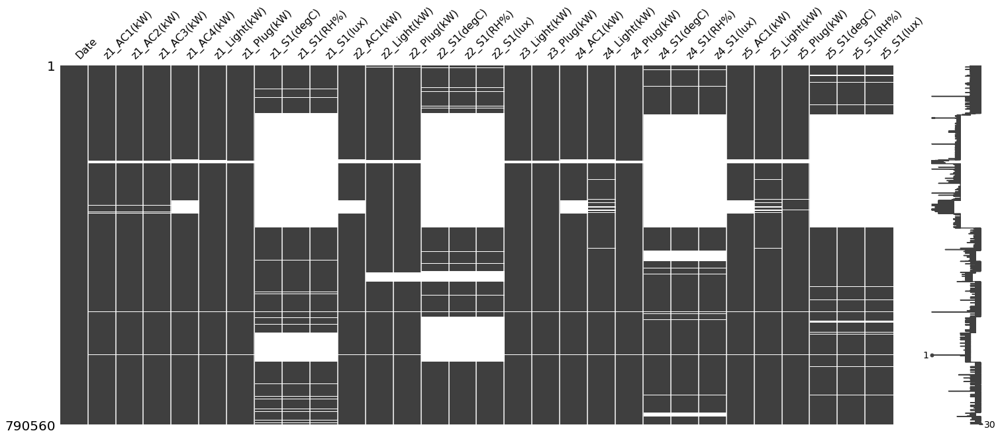

In [5]:
import missingno as msno
msno.matrix(df)

In [6]:
from dataprep.datasets import load_dataset

  0%|                                                                                          | 0/317 [00:00<…


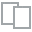
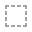
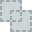
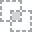
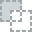
...
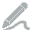
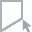
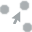
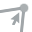
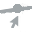

In [7]:
from dataprep.eda.missing import plot_missing
plot_missing(df)

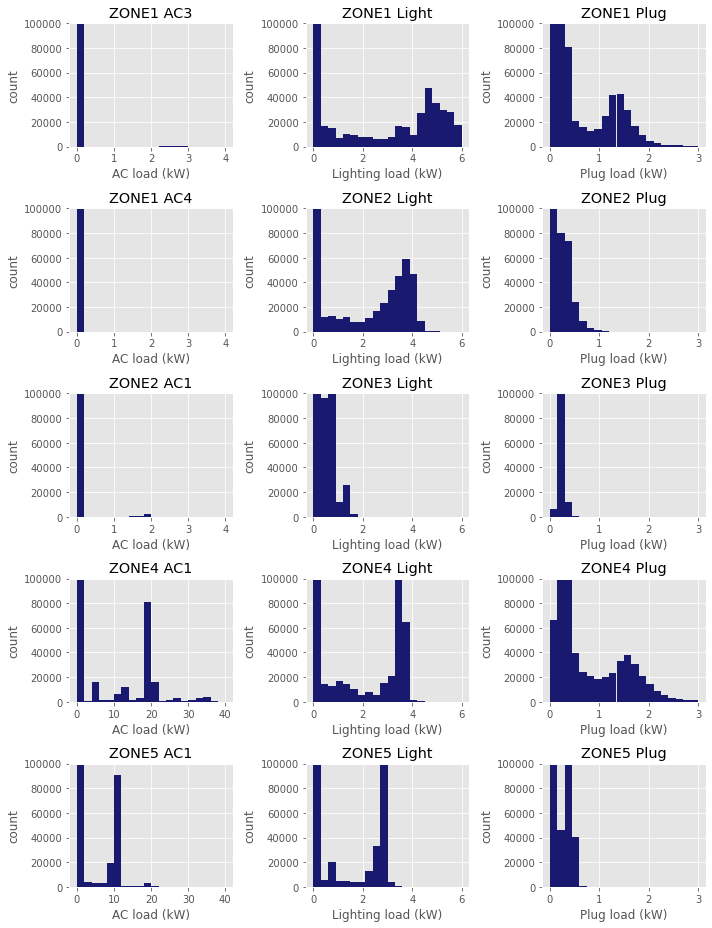

In [8]:
ylim=[4,4,4,40,40,40,40] #set Y limit
b=20 #set bin number
#set title 
title1A = ['z1_AC3(kW)', 'z1_AC4(kW)','z2_AC1(kW)','z4_AC1(kW)','z5_AC1(kW)']
title2A = ['ZONE1 AC3', 'ZONE1 AC4', 'ZONE2 AC1', 'ZONE4 AC1', 'ZONE5 AC1']
title1L = ['z1_Light(kW)', 'z2_Light(kW)', 'z3_Light(kW)','z4_Light(kW)','z5_Light(kW)']
title2L = ['ZONE1 Light', 'ZONE2 Light', 'ZONE3 Light', 'ZONE4 Light','ZONE5 Light']
title1P = ['z1_Plug(kW)', 'z2_Plug(kW)', 'z3_Plug(kW)','z4_Plug(kW)','z5_Plug(kW)']
title2P = ['ZONE1 Plug', 'ZONE2 Plug', 'ZONE3 Plug', 'ZONE4 Plug', 'ZONE5 Plug']

#create the sub-plot with 5 rows and 3 columns.
plt.style.use('ggplot')
fig, axs = plt.subplots(len(title1A), 3, figsize=(10,13), gridspec_kw={'width_ratios':[1,1,1]}, tight_layout=True)

#plot histogram of AC units in all 5 zones.
for i in np.arange(len(title1A)):
  axs[i,0].hist(df[title1A[i]],bins=b, range=[0,ylim[i]], color='midnightblue')
  axs[i,0].set_title(title2A[i])
  axs[i,0].set_ylim([0,100000])
  axs[i,0].set_xlabel('AC load (kW)')
  axs[i,0].set_ylabel('count')
#plot histogram of lighting loads in all 5 zones.
for i in np.arange(len(title1L)):
  axs[i,1].hist(df[title1L[i]],bins=b, range=[0,6], color='midnightblue')
  axs[i,1].set_title(title2L[i])
  axs[i,1].set_ylim([0,100000])
  axs[i,1].set_xlabel('Lighting load (kW)')
  axs[i,1].set_ylabel('count')
#plot histogram of plug loads in all 5 zones.
for i in np.arange(len(title1P)):
  axs[i,2].hist(df[title1P[i]],bins=b, range=[0,3], color='midnightblue')
  axs[i,2].set_title(title2P[i])
  axs[i,2].set_ylim([0,100000])
  axs[i,2].set_xlabel('Plug load (kW)')
  axs[i,2].set_ylabel('count')

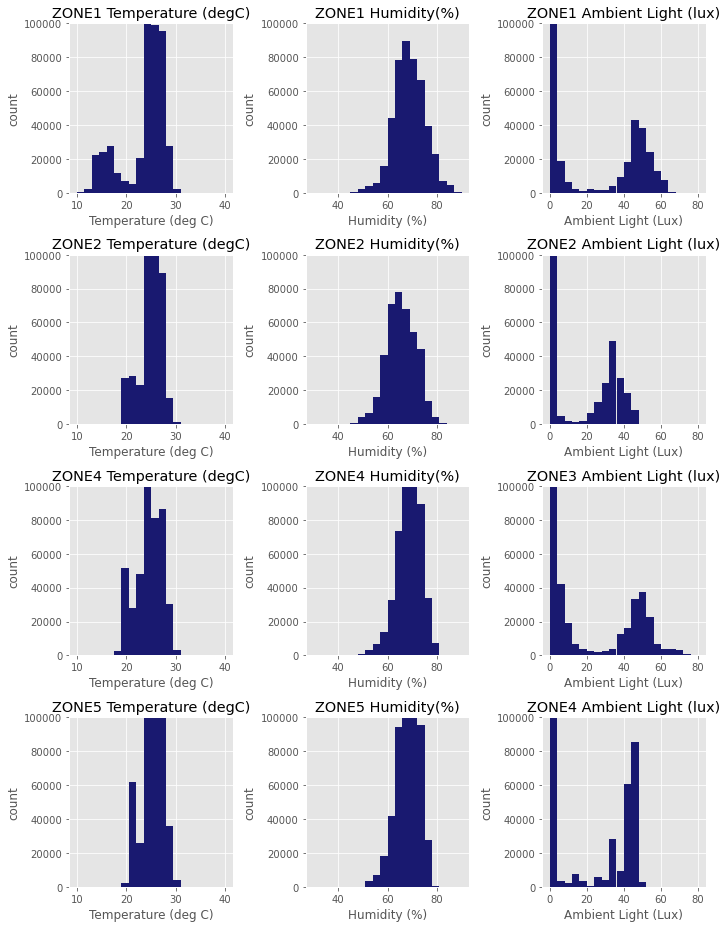

In [9]:
#set title 
title1T = ['z1_S1(degC)', 'z2_S1(degC)','z4_S1(degC)','z5_S1(degC)']
title2T = ['ZONE1 Temperature (degC)', 'ZONE2 Temperature (degC)', 'ZONE4 Temperature (degC)', 'ZONE5 Temperature (degC)']
title1H = ['z1_S1(RH%)', 'z2_S1(RH%)','z4_S1(RH%)','z5_S1(RH%)']
title2H = ['ZONE1 Humidity(%)', 'ZONE2 Humidity(%)', 'ZONE4 Humidity(%)', 'ZONE5 Humidity(%)']
title1I = ['z1_S1(lux)', 'z2_S1(lux)','z4_S1(lux)','z5_S1(lux)']
title2I = ['ZONE1 Ambient Light (lux)', 'ZONE2 Ambient Light (lux)', 'ZONE3 Ambient Light (lux)', 'ZONE4 Ambient Light (lux)','ZONE5 Ambient Light (lux)']

#create the sub-plot with 5 rows and 3 columns.
plt.style.use('ggplot')
fig, axs = plt.subplots(len(title1T), 3, figsize=(10,13), gridspec_kw={'width_ratios':[1,1,1]}, tight_layout=True)

#plot histogram of temperature readings in all 5 zones.
for i in np.arange(len(title1T)):
  axs[i,0].hist(df[title1T[i]],bins=b, range=[10,40], color='midnightblue')
  axs[i,0].set_title(title2T[i])
  axs[i,0].set_ylim([0,100000])
  axs[i,0].set_xlabel('Temperature (deg C)')
  axs[i,0].set_ylabel('count')

#plot histogram of humidity readings in all 5 zones.
for i in np.arange(len(title1H)):
  axs[i,1].hist(df[title1H[i]],bins=b, range=[30,90], color='midnightblue')
  axs[i,1].set_title(title2H[i])
  axs[i,1].set_ylim([0,100000])
  axs[i,1].set_xlabel('Humidity (%)')
  axs[i,1].set_ylabel('count')

#plot histogram of illuminance readings in all 5 zones.
for i in np.arange(len(title1I)):
  axs[i,2].hist(df[title1I[i]],bins=b, range=[0,80], color='midnightblue')
  axs[i,2].set_title(title2I[i])
  axs[i,2].set_ylim([0,100000])
  axs[i,2].set_xlabel('Ambient Light (Lux)')
  axs[i,2].set_ylabel('count')


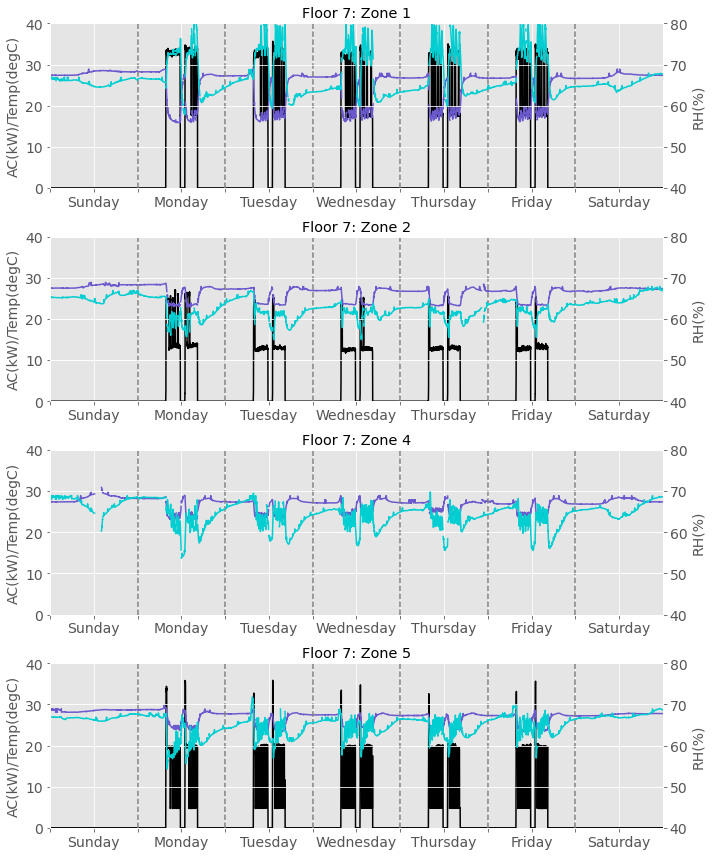

In [10]:
n=1     # Select which week to plot (n=0-51)
xrange=(1440*7*n,1440*7*(n+1))  #One day has 1440 minutes, so we plot the data for one week (7 days)
ylim1=(0,40)  # Set Y-axis1 limit
ylim2=(40,80) # Set Y-axis2 limit

# The following data columns will be plotted
title_AC = ['z1_AC4(kW)','z2_AC1(kW)','','z4_AC1(kW)','z5_AC1(kW)']
label_AC = ['ZONE1_AC4(kW)','ZONE2_AC1(kW)','ZONE4_AC1(kW)','ZONE5_AC1(kW)']
title_temp = ['z1_S1(degC)','z2_S1(degC)','z4_S1(degC)','z5_S1(degC)']
label_temp = ['ZONE1 (Temp,degC)','ZONE2 (Temp,degC)','ZONE4 (Temp,degC)','ZONE5 (Temp,degC)']
title_RH = ['z1_S1(RH%)','z2_S1(RH%)','z4_S1(RH%)','z5_S1(RH%)']
label_RH = ['ZONE1 (RH,%)','ZONE2 (RH,%)','ZONE4 (RH,%)','ZONE5 (RH,%)']
# These are the title to be set for each plot
title = ['Floor 7: Zone 1','Floor 7: Zone 2','Floor 7: Zone 4','Floor 7: Zone 5']

# Crate five subplots
plt.style.use('ggplot')
fig, axs = plt.subplots(len(title), figsize=(10,12), tight_layout=True)
plt.setp(axs, xticks=np.arange(14)*720+1440*7*n, # xtick at every 12 hours.
         xticklabels=['','Sunday','', 'Monday','','Tuesday','','Wednesday','','Thursday','','Friday','','Saturday'])

# Plot
i=0
for ax1 in axs.flat:
  if i!=2: # There is no AC in zone 3, so this plot is skipped.
    ax1.plot(df[title_AC[i]], color='black', label=label_AC[i]) # Plot AC based on the column heading
  ax1.plot(df[title_temp[i]], color='slateblue', label=label_temp[i]) # Plot temperature readings based on the column heading
  ax1.set_xlim(xrange)
  ax1.set_ylim(ylim1)
  ax1.set_ylabel('AC(kW)/Temp(degC)', fontsize=14)
  ax1.set_title(title[i])
  ax1.tick_params(axis='both', which ='major', labelsize=14)
  
  ax2 = ax1.twinx() # Create the secondary axis
  ax2.plot(df[title_RH[i]], color='darkturquoise', label=label_RH[i]) # Plot RH readings based on the column heading
  ax2.set_ylim(ylim2)
  ax2.set_ylabel('RH(%)', fontsize=14)
  ax2.tick_params(axis='both', which ='major', labelsize=14)
  i=i+1

# Draw vertical dash line
for i in np.arange(7)*1440+1440*7*n:
  for ax in axs.flat:
    ax.axvline(x=i, color='grey',linestyle='--')

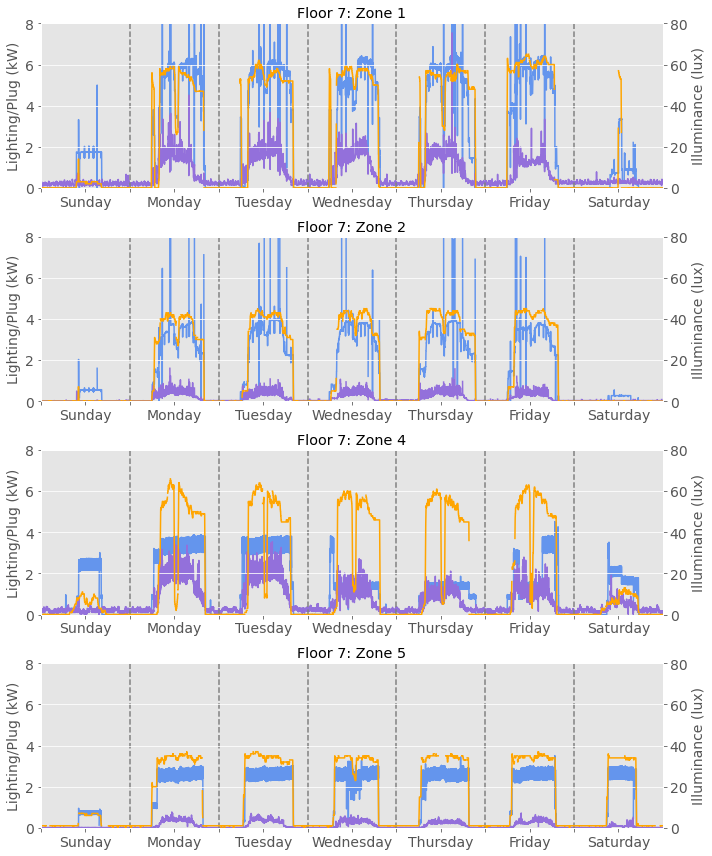

In [11]:
n=8
xrange=(1440*7*n,1440*7*n+1440*7)
yrange=(0,12)
ylim2=(0,80)

title_light = ['z1_Light(kW)','z2_Light(kW)','z4_Light(kW)','z5_Light(kW)']
title_plug = ['z1_Plug(kW)','z2_Plug(kW)','z4_Plug(kW)','z5_Plug(kW)']
title_lux = ['z1_S1(lux)','z2_S1(lux)','z4_S1(lux)','z5_S1(lux)']
title = ['Floor 7: Zone 1','Floor 7: Zone 2','Floor 7: Zone 4','Floor 7: Zone 5']

plt.style.use('ggplot')
fig, axs = plt.subplots(len(title), figsize=(10,12), tight_layout=True)
plt.setp(axs, xticks=np.arange(14)*720+1440*7*n,
         xticklabels=['','Sunday','', 'Monday','','Tuesday','','Wednesday','','Thursday','','Friday','','Saturday'])

i=0
for ax1 in axs.flat:
  ax1.plot(df[title_light[i]], color='cornflowerblue')
  ax1.plot(df[title_plug[i]], color='mediumpurple')
  ax1.set_xlim(xrange)
  ax1.set_ylim(0,8)
  ax1.grid(False)
  ax1.set_ylabel('Lighting/Plug (kW)', fontsize=14)
  ax1.tick_params(axis='both', which ='major', labelsize=14) 
  ax1.set_title(title[i])

  ax2 = ax1.twinx()
  ax2.plot(df[title_lux[i]], color='orange')
  ax2.set_ylim(ylim2)
  ax2.set_ylabel('Illuminance (lux)', fontsize=14)
  ax2.tick_params(axis='both', which ='major', labelsize=14)  
  i=i+1

for i in np.arange(7)*1440+1440*7*n:
  for ax in axs.flat:
    ax.axvline(x=i, color='grey',linestyle='--')

In [12]:
# Then, we will add all electrical loads together.
df=df.fillna(0) #fill all missing data with zero.
df['Floor7Sum'] = df['z1_AC1(kW)']+df['z1_AC2(kW)']+df['z1_AC3(kW)']+df['z1_AC4(kW)']+df['z1_Light(kW)']+df['z1_Plug(kW)']+df['z2_AC1(kW)']+df['z2_Light(kW)']+df['z2_Plug(kW)']+df['z2_S1(degC)']+df['z2_S1(RH%)']+df['z2_S1(lux)']+df['z3_Light(kW)']+df['z3_Plug(kW)']+ df['z4_AC1(kW)']+df['z4_Light(kW)']+df['z4_Plug(kW)']+df['z4_S1(degC)']+df['z4_S1(RH%)']+df['z4_S1(lux)']+df['z5_AC1(kW)']+df['z5_Light(kW)']+df['z5_Plug(kW)']+df['z5_S1(degC)']+df['z5_S1(RH%)']+df['z5_S1(lux)']

Text(0.5, 1.0, 'Floor 7 Load (kW)')

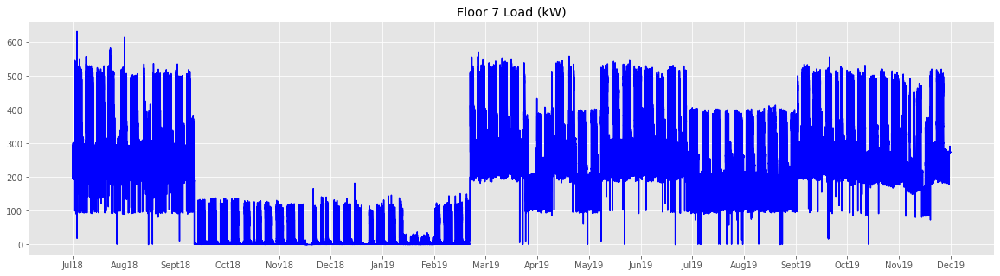

In [13]:
labels=['Jul18','Aug18','Sept18','Oct18','Nov18','Dec18','Jan19','Feb19','Mar19','Apr19','May19','Jun19','Jul19','Aug19','Sept19','Oct19','Nov19','Dec19']
ticks= np.linspace(0,790559,18)
plt.figure(figsize=(20,5))
ax = df['Floor7Sum'].plot(color='blue')#, ylim=(0,200))
plt.xticks(ticks,labels)
ax.set_title('Floor 7 Load (kW)')

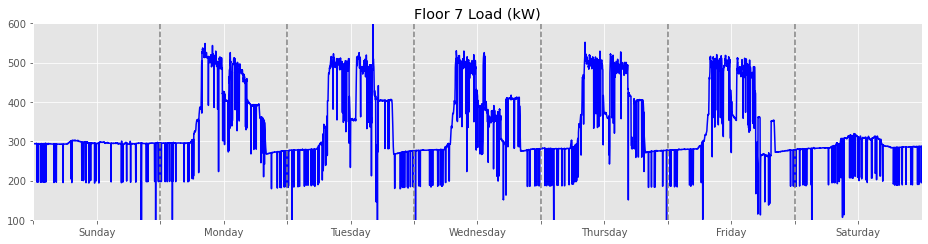

In [14]:
n=0 #n=week, ranging from 0-51
xrange=(1440*7*n,1440*7*n+1440*7)
yrange=(100,600)
ticks = np.arange(14)*720+1440*7*n
labels = ['','Sunday','', 'Monday','','Tuesday','','Wednesday','','Thursday','','Friday','','Saturday']
plt.style.use('ggplot')
plt.figure(figsize=(13,3.5), tight_layout=True)
plt.xticks(ticks, labels)
ax = df['Floor7Sum'].plot(color='blue', xlim=xrange, ylim=yrange)
ax.set_title('Floor 7 Load (kW)')

for i in np.arange(7)*1440+1440*7*n:
  ax.axvline(x=i, color='grey',linestyle='--')